In [1]:
import pandas as pd
import numpy as np 
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import OrdinalEncoder 
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import KFold , cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression

In [2]:
dt = pd.read_csv('dataset-v6.csv')

In [3]:
dtcopy = dt.copy()

In [4]:
dt.drop(columns = 'Unnamed: 0' , inplace = True)

In [9]:
dt

,sector,propertyType,builtup,bedRooms,bathRooms,agePossesion,balcony,pooja room,servant room,study room,others,store room,luxCat,heightCat,Y
0,27.0,1.0,1773.00,6.0,6.0,3.0,3.0,0,0,0,0,0,0.0,1.0,4.26
1,35.0,0.0,1554.40,3.0,3.0,3.0,1.0,0,0,0,0,0,2.0,2.0,1.70
2,60.0,0.0,1431.20,3.0,3.0,3.0,4.0,0,0,0,0,1,2.0,2.0,2.50
3,77.0,1.0,4509.00,4.0,4.0,3.0,2.0,0,1,1,0,0,0.0,1.0,10.40
4,109.0,1.0,4350.00,4.0,4.0,3.0,4.0,1,1,1,0,1,2.0,1.0,6.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3599,50.0,1.0,1467.00,4.0,5.0,3.0,4.0,0,0,0,0,1,1.0,1.0,5.30
3600,81.0,1.0,4500.00,5.0,6.0,0.0,4.0,0,1,0,0,0,0.0,1.0,26.00
3601,100.0,1.0,4500.00,5.0,5.0,3.0,4.0,1,0,1,0,0,2.0,1.0,14.00
3602,91.0,0.0,3118.40,3.0,3.0,3.0,3.0,0,1,1,0,0,1.0,0.0,6.80


In [11]:
X = dt.iloc[:,0:-1]
yTrans = np.log1p(dt['Y'])

# no Encoding

In [14]:
colTransformer  = ColumnTransformer(
    transformers  = [
        ('num' , StandardScaler() , ['builtup','bedRooms','bathRooms','balcony']) ], 
        remainder = 'passthrough' 
    )

In [16]:
pipe = Pipeline([
        ('preprocessing' , colTransformer),
        ('regressor' , LinearRegression())
    ])

In [18]:
kfold = KFold( n_splits = 10 , shuffle = True , random_state = 42)
scores = cross_val_score(pipe , X , yTrans , cv = kfold , scoring = 'r2')

In [20]:
scores.mean() , scores.std()

(0.703961110041035, 0.03153910139070729)

In [22]:
xTrain,xTest,yTrain,yTest = train_test_split(X,yTrans , test_size = 0.2 , random_state = 42)

In [24]:
pipe.fit(xTrain,yTrain)

,steps,"[('preprocessing', ...), ('regressor', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [26]:
yPred = pipe.predict(xTest)
yPred = np.expm1(yPred)

In [28]:
mean_absolute_error(np.expm1(yTest) , yPred)

1.9960953468761118

In [30]:
# this is huge MAE , now we will create a function and test all the models their accuracy and MAE s 

In [33]:
#importing all the models 

from sklearn.linear_model import Ridge, Lasso

from sklearn.tree import DecisionTreeRegressor

from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, AdaBoostRegressor

from sklearn.neural_network import MLPRegressor

from xgboost import XGBRegressor


In [35]:
def score(name,model):
    
    output = {}
    
    colTransformer  = ColumnTransformer(
    transformers  = [
        ('num' , StandardScaler() , ['builtup','bedRooms','bathRooms',]) ], 
        remainder = 'passthrough' 
    )
    
    pipe = Pipeline([
        ('preprocessing' , colTransformer),
        ('model' , model)
    ])
    
    kfold = KFold( n_splits = 10 , shuffle = True , random_state = 42)
    scores = cross_val_score(pipe , X , yTrans , cv = kfold , scoring = 'r2')
    
    xTrain,xTest,yTrain,yTest = train_test_split(X,yTrans , test_size = 0.2 , random_state = 42)
    
    pipe.fit(xTrain,yTrain)
    yPred = pipe.predict(xTest)
    yPred = np.expm1(yPred)

    mae = mean_absolute_error(np.expm1(yTest),yPred)

    output[name] = [scores.mean(),mae]

    return output 

In [37]:
models = {
    'ridge':Ridge(),
    'lasso':Lasso(),
    'randomForest':RandomForestRegressor(),
    'extraTree':ExtraTreesRegressor(),
    'gradientBoost':GradientBoostingRegressor(),
    'adaBoost':AdaBoostRegressor(),
    'mlp':MLPRegressor(),
    'xgboost':XGBRegressor()
}

In [39]:
out = []

for name in models:

    out.append(score(name,models[name]))

In [40]:
out 

[{'ridge': [0.7039671048006185, 1.9961343402292262]},
 {'lasso': [0.012752532368353164, 3.4615165314862932]},
 {'randomForest': [0.8490674671720717, 1.2952094178438902]},
 {'extraTree': [0.8287149074499369, 1.391345851029481]},
 {'gradientBoost': [0.821151143157674, 1.5264886152566872]},
 {'adaBoost': [0.7179960034724964, 1.9812941985308847]},
 {'mlp': [0.7175014539867327, 1.8584435298418653]},
 {'xgboost': [0.8593462390032836, 1.212778422581174]}]

In [284]:
# the best model is xgboost followed by randomForest 
# the wortst performing are the linear models  Lasso , ridge  , linear reg

# one hot encoding 

In [41]:
def score(name,model):
    
    output = {}
    
    colTransformer  = ColumnTransformer(
    transformers  = [
        ('num' , StandardScaler() , ['builtup','bedRooms','bathRooms',]),
        ('cat' , OneHotEncoder(handle_unknown = 'ignore' ,drop = 'first') , ['sector'] )], 
        remainder = 'passthrough' 
    )
    
    pipe = Pipeline([
        ('preprocessing' , colTransformer),
        ('model' , model)
    ])
    
    kfold = KFold( n_splits = 10 , shuffle = True , random_state = 42)
    scores = cross_val_score(pipe , X , yTrans , cv = kfold , scoring = 'r2')
    
    xTrain,xTest,yTrain,yTest = train_test_split(X,yTrans , test_size = 0.2 , random_state = 42)
    
    pipe.fit(xTrain,yTrain)
    yPred = pipe.predict(xTest)
    yPred = np.expm1(yPred)

    mae = mean_absolute_error(np.expm1(yTest),yPred)

    output[name] = [scores.mean(),mae]

    return output 

In [42]:
out = []

for name in models:

    out.append(score(name,models[name]))

/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn

In [43]:
out

[{'ridge': [0.8007623562662889, 1.5710015698185225]},
 {'lasso': [-0.0026095149843715416, 3.4605445021991055]},
 {'randomForest': [0.8504955080700908, 1.2599462541637678]},
 {'extraTree': [0.8526398588072931, 1.1939278666769488]},
 {'gradientBoost': [0.810459088391125, 1.589225668023572]},
 {'adaBoost': [0.7010857433111812, 2.071153065135522]},
 {'mlp': [0.815806295729605, 1.389107590156183]},
 {'xgboost': [0.8601652194847531, 1.2524759040460836]}]

In [44]:
# the best came to be extratree but the xgboost is just slight less than extra tree its comparable 

# target encoding 

In [46]:
import category_encoders as ce

In [47]:
def score(name,model):
    
    output = {}
    
    colTransformer  = ColumnTransformer(
    transformers  = [
        ('num' , StandardScaler() , ['builtup','bedRooms','bathRooms',]),
        ('enc' , ce.TargetEncoder() ,['sector']  )], 
        remainder = 'passthrough' 
    )
    
    pipe = Pipeline([
        ('preprocessing' , colTransformer),
        ('model' , model)
    ])
    
    kfold = KFold( n_splits = 10 , shuffle = True , random_state = 42)
    scores = cross_val_score(pipe , X , yTrans , cv = kfold , scoring = 'r2')
    
    xTrain,xTest,yTrain,yTest = train_test_split(X,yTrans , test_size = 0.2 , random_state = 42)
    
    pipe.fit(xTrain,yTrain)
    yPred = pipe.predict(xTest)
    yPred = np.expm1(yPred)

    mae = mean_absolute_error(np.expm1(yTest),yPred)

    output[name] = [scores.mean(),mae]

    return output 

In [48]:
out=[]
for name in models:
    out.append(score(name,models[name]))

In [49]:
out

[{'ridge': [0.7039671048006185, 1.9961343402292262]},
 {'lasso': [0.012752532368353164, 3.4615165314862932]},
 {'randomForest': [0.8483731793963123, 1.2728776381862206]},
 {'extraTree': [0.8279101359545633, 1.3667307092049716]},
 {'gradientBoost': [0.8212977669508676, 1.5258772836866241]},
 {'adaBoost': [0.7154416981989455, 2.0326640927560296]},
 {'mlp': [0.7009813268326026, 1.9241124871920483]},
 {'xgboost': [0.8593462390032836, 1.212778422581174]}]

In [50]:
# so the random forest and xgboost gave the best results , and with this target encoding 
# i will do the hyperparameter tuning using the xgboost

# hyperparameter tuning

In [51]:
from sklearn.model_selection import GridSearchCV

In [52]:
paramGrid = {
    'model__max_depth' : [3,7,10,14],
    'model__n_estimators' : [100,400,700,800],
    'model__reg_lambda' : [0,3,7,9],
    'model__reg_alpha' : [0,3,7,9],
    'model__learning_rate' : [0.01,0.05,0.1,0.2],
    'model__subsample': [0.6, 0.8, 1.0],
    'model__colsample_bytree': [0.6, 0.8, 1.0]
}

In [53]:
transformer = ColumnTransformer(
    transformers = [
        ('num',StandardScaler(),['builtup','bedRooms','bathRooms']),
        ('enc',ce.TargetEncoder() , ['sector'])
    ] , 
    remainder = 'passthrough' )

In [54]:
pipeline = Pipeline([
    ('preprocess',transformer),
    ('model',XGBRegressor(n_jobs=-1))
])

In [55]:
Fold = KFold(n_splits = 10, shuffle = True , random_state = 42)

grid = GridSearchCV(pipeline , paramGrid , scoring = 'r2' , cv = Fold , refit = True , verbose = 3 , n_jobs = -1)

In [56]:
xTrain, xTest, yTrain, yTest = train_test_split(X, yTrans, test_size=0.2, random_state=42)


In [83]:
grid.fit(xTrain,yTrain)

Fitting 10 folds for each of 9216 candidates, totalling 92160 fits
[CV 7/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=3, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=0, model__subsample=0.6;, score=0.608 total time=   0.0s
[CV 5/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=3, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=0, model__subsample=0.8;, score=0.639 total time=   0.0s
[CV 1/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=3, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=0, model__subsample=1.0;, score=0.642 total time=   0.0s
[CV 5/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=3, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=3, model__subsample=0.6;, score=0.634 total time=   0.0s
[CV 4/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=3, mod

/opt/homebrew/anaconda3/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



[CV 5/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=10, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=3, model__subsample=0.6;, score=0.670 total time=   0.1s
[CV 6/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=10, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=3, model__subsample=0.6;, score=0.667 total time=   0.1s
[CV 3/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=10, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=3, model__subsample=0.8;, score=0.632 total time=   0.1s
[CV 4/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=10, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=3, model__subsample=0.8;, score=0.676 total time=   0.1s
[CV 7/10] END model__colsample_bytree=0.6, model__learning_rate=0.01, model__max_depth=10, model__n_estimators=100, model__reg_alpha=0, model__reg_lambda=7

,estimator,"Pipeline(step...=None, ...))])"
,param_grid,"{'model__colsample_bytree': [0.6, 0.8, ...], 'model__learning_rate': [0.01, 0.05, ...], 'model__max_depth': [3, 7, ...], 'model__n_estimators': [100, 400, ...], ...}"
,scoring,'r2'
,n_jobs,-1
,refit,True
,cv,KFold(n_split... shuffle=True)
,verbose,3
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,transformers,"[('num', ...), ('enc', ...)]"


In [85]:
grid.best_params_

{'model__colsample_bytree': 0.6,
 'model__learning_rate': 0.01,
 'model__max_depth': 10,
 'model__n_estimators': 800,
 'model__reg_alpha': 0,
 'model__reg_lambda': 0,
 'model__subsample': 0.6}

In [87]:
grid.best_score_

0.8655822205947086

In [95]:
yPred = grid.predict(xTest)
yPred = np.expm1(yPred)

In [97]:
mean_absolute_error(np.expm1(yTest),yPred)

1.1893485991468706

In [107]:
# the MAE is still high lets try checking for some outliers 

<Axes: xlabel='Y'>

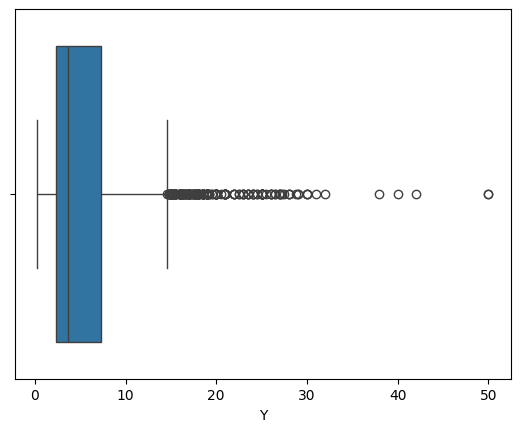

In [57]:
import seaborn as sns 
sns.boxplot(dt['Y'],orient='h')

In [58]:
dt = dt[dt['Y'] <= 15]

<Axes: xlabel='Y'>

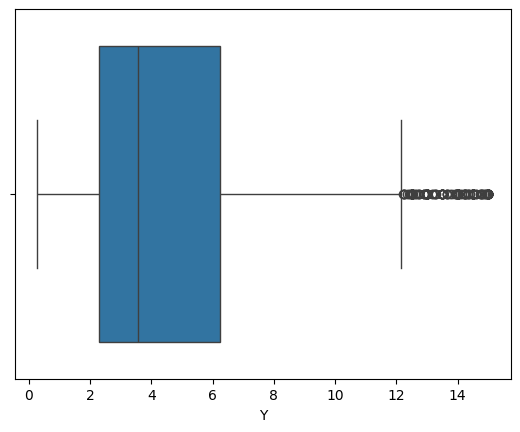

In [59]:
sns.boxplot(dt['Y'],orient='h')

In [60]:
X = dt.iloc[:,0:-1]
X['sector'] = X['sector'].astype('object')
yTrans = np.log1p(dt['Y'])

In [61]:
colTransformer  = ColumnTransformer(
    transformers  = [
        ('num' , StandardScaler() , ['builtup','bedRooms','bathRooms',]),
        ('enc' , ce.TargetEncoder() ,['sector']  )], 
        remainder = 'passthrough' 
    )
    
pipe = Pipeline([
        ('preprocessing' , colTransformer),
        ('model' , XGBRegressor(colsample_bytree= 0.6,
                                 learning_rate= 0.01,
                                 max_depth= 10,
                                 n_estimators= 800,
                                 reg_alpha= 0,
                                 reg_lambda= 0,
                                 subsample= 0.6,
                                 n_jobs=-1)) 
    ])


In [62]:
xTrain, xTest, yTrain, yTest = train_test_split(X, yTrans, test_size=0.2, random_state=42)

In [63]:
pipe.fit(xTrain,yTrain)

,steps,"[('preprocessing', ...), ('model', ...)]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('num', ...), ('enc', ...)]"
,remainder,'passthrough'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [64]:
yPred = pipe.predict(xTest)
yPred = np.expm1(yPred)
mean_absolute_error(np.expm1(yTest),yPred)

0.7884100048003656

In [65]:
# so by dropping just 200 rows from 3600 around 5.5% , our MAE reduced to 0.78

# exporting the pipeline

In [68]:
import pickle

In [69]:
# this is a lib used to import and export the pipelines 

In [70]:
with open('pipeline.pkl' , 'wb') as file :
    pickle.dump(pipe,file)

In [71]:
with open('dt.pkl','wb') as file:
          pickle.dump(X,file)